# ***LOADING LIBRARIES***

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

In [ ]:
pip install cellrank --quiet

Note: you may need to restart the kernel to use updated packages.


In [ ]:
!pip install scvelo --upgrade --quiet

In [ ]:
pip install python-igraph

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install jgraph --upgrade --quiet

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install louvain

Note: you may need to restart the kernel to use updated packages.


#IMPORTING LIBRARIES

In [ ]:
import cellrank as cr

In [ ]:
import scvelo as scv
import pandas as pd
#import velocyto as vcy
import time
import scipy
import pickle
import numpy as np
import pandas as pd
import scanpy as scp
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib_venn as ven
from matplotlib.gridspec import GridSpec

import sklearn
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score, cohen_kappa_score, confusion_matrix, recall_score, classification_report, precision_score
from scipy.stats import spearmanr, zscore
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso, Ridge, ElasticNet
import scvelo as scv
scv.logging.print_version()
import jgraph as ig
from sklearn.svm import SVC
import os

Running scvelo 0.2.4 (python 3.8.5) on 2021-10-05 11:27.


In [ ]:
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization
scv.set_figure_params()

Running scvelo 0.2.4 (python 3.8.5) on 2021-10-05 11:27.


In [ ]:
#reading loom file
file = "Upf3b-knockout.loom"
adata = scv.read_loom(file)
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 20868 × 55487
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

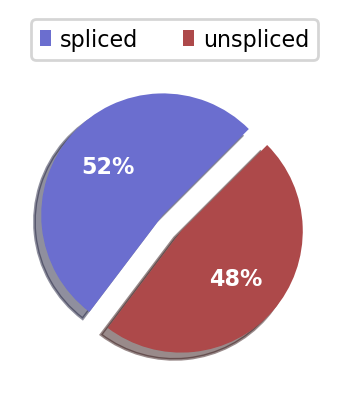

In [ ]:
#making variable names unique
adata.var_names_make_unique()
scv.pl.proportions(adata)

# sub-cluster the OSNs

In [ ]:
#reading mature barcodes
m = pd.read_csv('mature_barcodes.csv')
m = m['Unnamed: 0']
m = m.values.tolist()
a = adata.obs.index
a = a.to_list()

In [ ]:
#intersecting mature barcodes with data 
l = []
for i in range(len(a)):
    for j in range(len(m)):
        if (a[i] == (m[j])):
            l.append(a[i])

In [ ]:
len(l)

4583

In [ ]:
#reading immature barcodes
im = pd.read_csv('immature_barcodes.csv')
im = im['Unnamed: 0']
im = im.values.tolist()

In [ ]:
#intersecting immature barcodes with data
li = []
for i in range(len(a)):
    for j in range(len(im)):
        if (a[i] == (im[j])):
            li.append(a[i])

In [ ]:
len(li)

1889

**The selected cell data is retrieved from metadata**

In [ ]:
matcell = l
immatcell = li

In [ ]:
mature = adata[matcell,:]
immature = adata[immatcell, :]

In [ ]:
mature.obs['cluster'] = 'mature'
immature.obs['cluster'] = 'immature'

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [ ]:
final = mature.concatenate(immature)

In [ ]:
i = final.obs.index.tolist()
it = [sub[ : -2] for sub in i]
final.obs.index = it

# SAVING RAW FILE

In [ ]:
#file with all genes
bdata = final
bdata.write_loom("raw_data_cluster.loom", write_obsm_varm=True)

In [ ]:
final

AnnData object with n_obs × n_vars = 6472 × 55487
    obs: 'cluster', 'batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

# STEP 3: The OSN data being processed for analysis

In [ ]:
#reading file with all genes
f = scv.read_loom("raw_data_cluster.loom")
f

AnnData object with n_obs × n_vars = 6472 × 55487
    obs: 'batch', 'cluster'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [ ]:
# filtering cells and genes
scp.pp.filter_cells(f, min_genes=200)
scp.pp.filter_genes(f, min_cells=3)

In [ ]:
# annotate the group of mitochondrial genes as 'mt'
f.var['mt'] = f.var_names.str.startswith('MT-')  
scp.pp.calculate_qc_metrics(f, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

... storing 'batch' as categorical
... storing 'cluster' as categorical
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


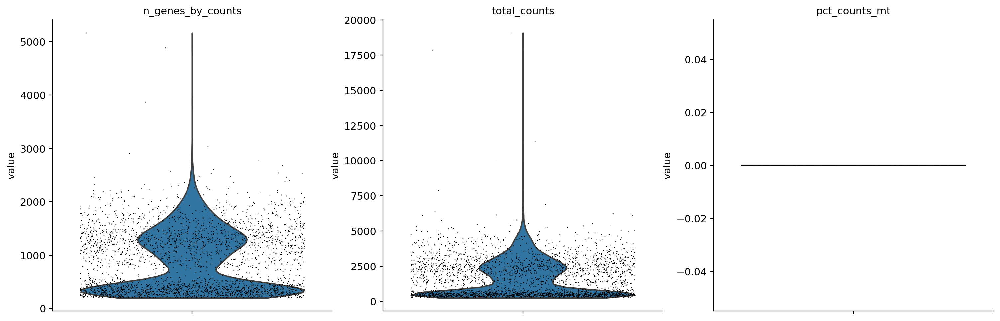

In [ ]:
#plotting n_genes_by_counts, total counts and mitochondrial genes
scp.pl.violin(f, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, save = 'cell_counts.pdf')

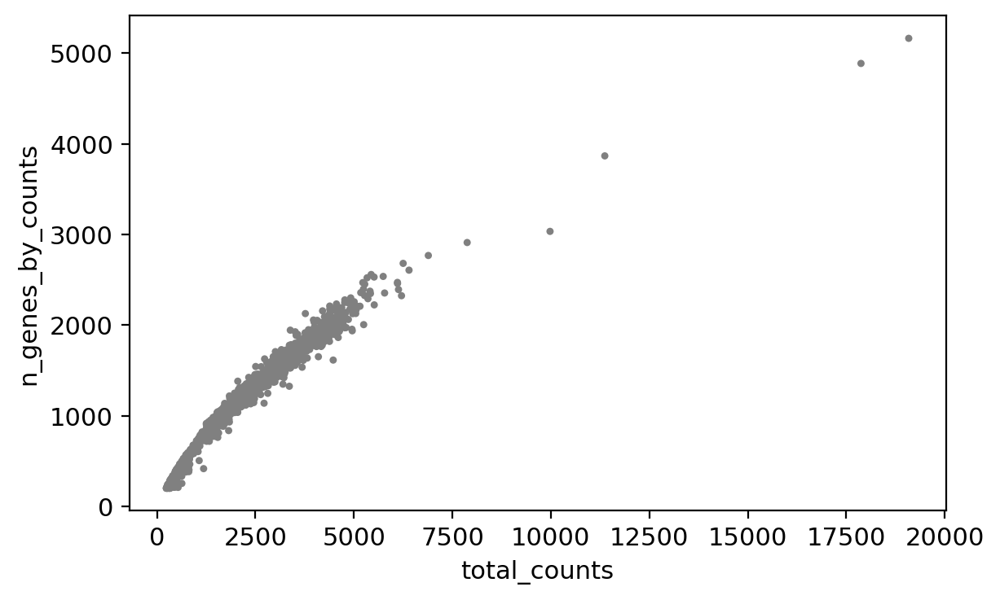

In [ ]:
scp.pl.scatter(f, x='total_counts', y='n_genes_by_counts')

In [ ]:
#filtering cells on basis of mitochondrial genes and n genes by counts
f = f[f.obs.n_genes_by_counts < 2500, :]
f = f[f.obs.pct_counts_mt < 5, :]
f

View of AnnData object with n_obs × n_vars = 2905 × 15315
    obs: 'batch', 'cluster', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [ ]:
#adding column of cellID and gene
print(f.obs.index)
f.obs['CellID'] = f.obs.index
print(f.obs)
print(f.var.index)
f.var['Gene'] = f.var.index
print(f.var)

Trying to set attribute `.obs` of view, copying.


Index(['AACTGGTCAAACAACA_KO2', 'AACGTTGCATGGTTGT_KO2', 'AACTCCCGTTGGAGGT_KO2',
       'AACCATGGTCGCATCG_KO2', 'AACGTTGGTTGGAGGT_KO2', 'AACACGTTCACTCTTA_KO2',
       'AAAGTAGAGTCGATAA_KO2', 'AACCATGGTCTGGTCG_KO2', 'AACTCCCGTACAAGTA_KO2',
       'AAATGCCTCGTCTGAA_KO2',
       ...
       'TTCTTAGAGTTAGCGG_KO4', 'TTGAACGCAGTGAGTG_KO4', 'TTGACTTAGTAGGCCA_KO4',
       'TTGCGTCGTAAGCACG_KO4', 'TTGGAACAGAACAACT_KO4', 'TTTACTGAGGGATACC_KO4',
       'TTTGCGCCACGCATCG_KO4', 'TTTATGCCAATAAGCA_KO4', 'TTTCCTCTCTGCTTGC_KO4',
       'TTTGTCATCGGACAAG_KO4'],
      dtype='object', length=2905)
                     batch   cluster  n_genes  n_genes_by_counts  \
AACTGGTCAAACAACA_KO2     0    mature     1310               1308   
AACGTTGCATGGTTGT_KO2     0    mature     1693               1693   
AACTCCCGTTGGAGGT_KO2     0    mature     1454               1451   
AACCATGGTCGCATCG_KO2     0    mature     1198               1196   
AACGTTGGTTGGAGGT_KO2     0    mature     1838               1837   
...      

# SAVING FILTERED FILE

In [ ]:
#file with filtered genes
cdata = f
cdata.write_loom("filtered_data_cluster.loom", write_obsm_varm=True)

In [ ]:
#basic preprocessing of data
#filtering and normalizing data, calculating neighbors and moments
scv.pp.filter_and_normalize(f, n_top_genes=2000)
scv.pp.neighbors(f)
scv.pp.moments(f, n_pcs=30, n_neighbors=30)

Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [ ]:
#calculating velocity and velocity graph on basis of sparse matrix with cosine correlation
scv.tl.velocity(f)
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res


    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [ ]:
#calculating umap coordinates and clustering using louvain algorithm
scv.tl.umap(f, n_components=2)
scv.tl.louvain(f)

# READ RAW DATA AND CHECK EXPRESSION

In [ ]:
#reading loom file with filtered genes
ddata = scv.read_loom("filtered_data_cluster.loom", sparse=False)
ddata

AnnData object with n_obs × n_vars = 2905 × 15315
    obs: 'batch', 'cluster', 'n_genes', 'n_genes_by_counts', 'pct_counts_mt', 'total_counts', 'total_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mean_counts', 'mt', 'n_cells', 'n_cells_by_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [ ]:
#adding louvain cluster info to filtered file
c = f.obs['louvain']
ddata.obs['louvain'] = c

... storing 'batch' as categorical
... storing 'cluster' as categorical
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


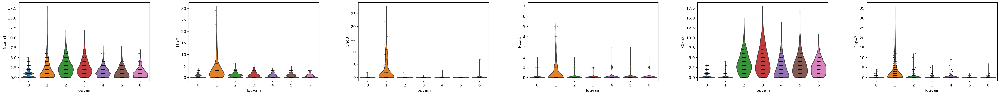

In [ ]:
#Expression of Immature neuron marker to assign clusters their stage
immature_neuron_markers = ["Ncam1","Lhx2","Gng8", "Rcor1","Ctxn3","Gap43"]
scp.pl.violin(ddata, keys=immature_neuron_markers, groupby='louvain', save = 'immature_neurons_exp.pdf')

         Falling back to preprocessing with `sc.pp.pca` and default params.


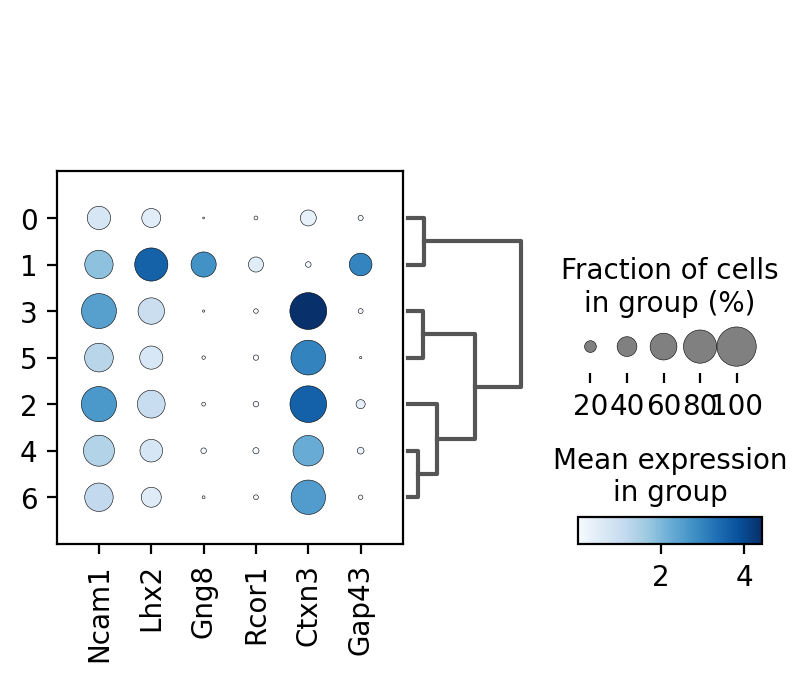

In [ ]:
scp.pl.dotplot(ddata, immature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-immature-exp.pdf')

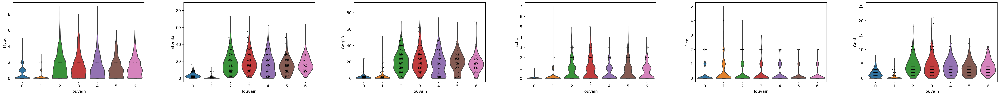

In [ ]:
#Mature neuron markers to name the clusters on basis of stage
mature_neuron_markers = ["Myo6", "Stoml3","Gng13","Ech1","Dcx","Gnal"]
scp.pl.violin(ddata, keys=mature_neuron_markers, groupby='louvain', save = 'mature-exp.pdf')

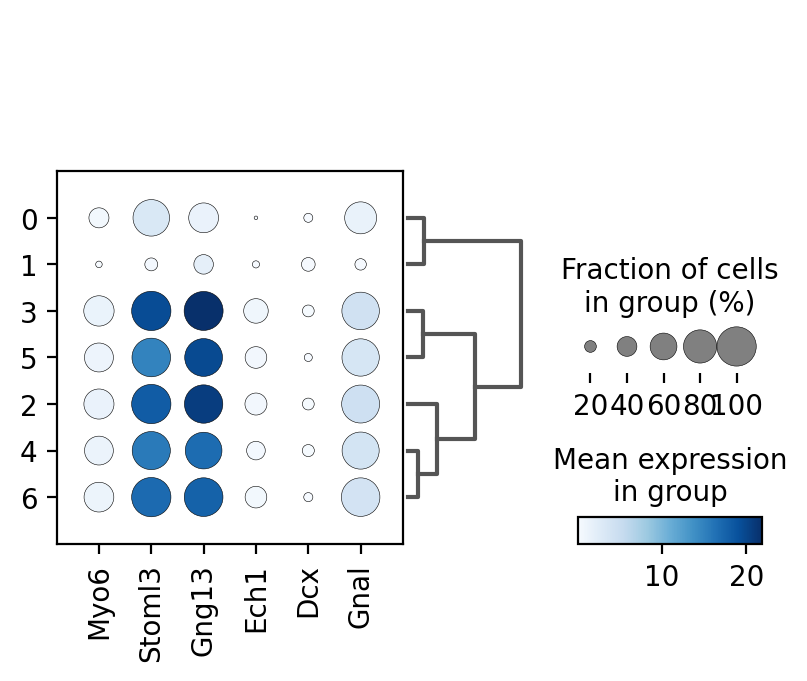

In [ ]:
scp.pl.dotplot(ddata, mature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-mature-exp.pdf')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_velocity-embedding.pdf


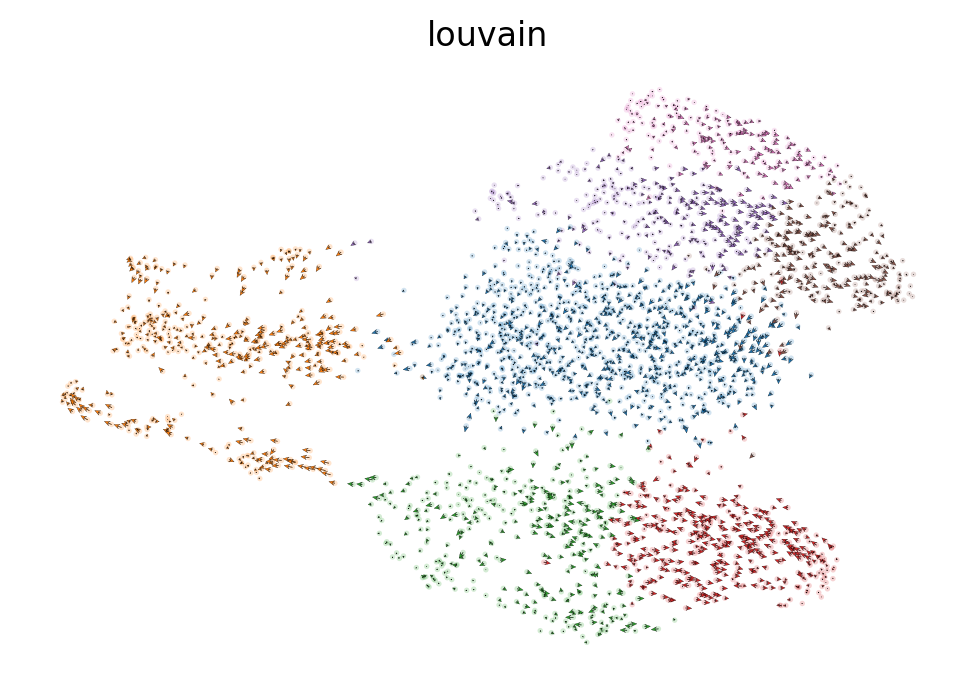

In [ ]:
scv.pl.velocity_embedding(f, basis = 'umap', color = 'louvain', save = 'velocity-embedding.pdf')

saving figure to file ./figures/scvelo_velocity-embedding-stream-steady.pdf


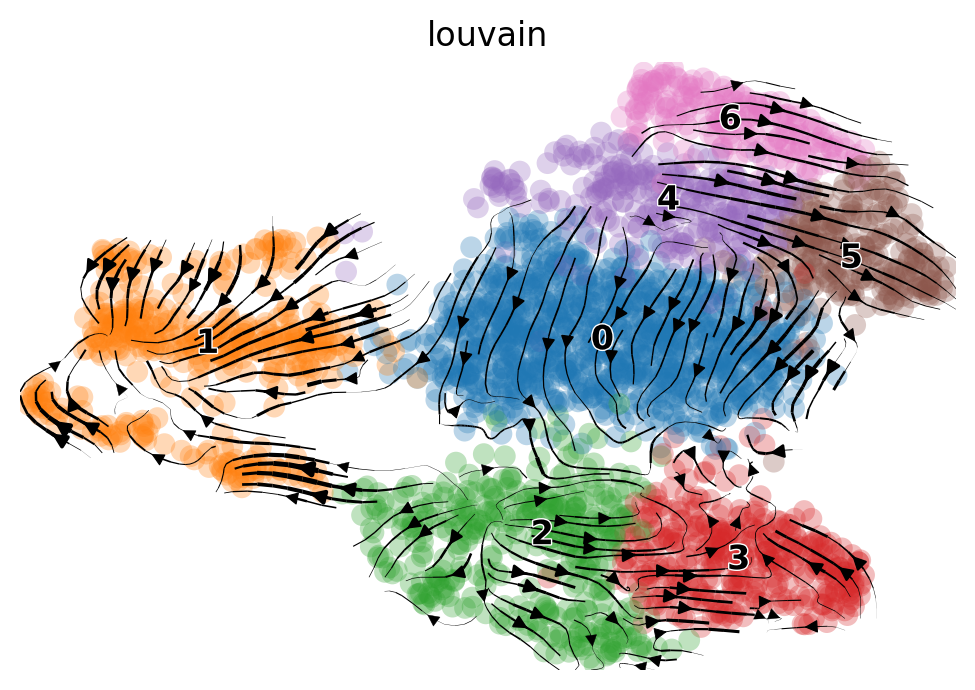

In [ ]:
scv.pl.velocity_embedding_stream(f, basis = 'umap', color = "louvain",save = 'velocity-embedding-stream-steady.pdf')

saving figure to file ./figures/scvelo_velocity-embedding-stream-cluster.pdf


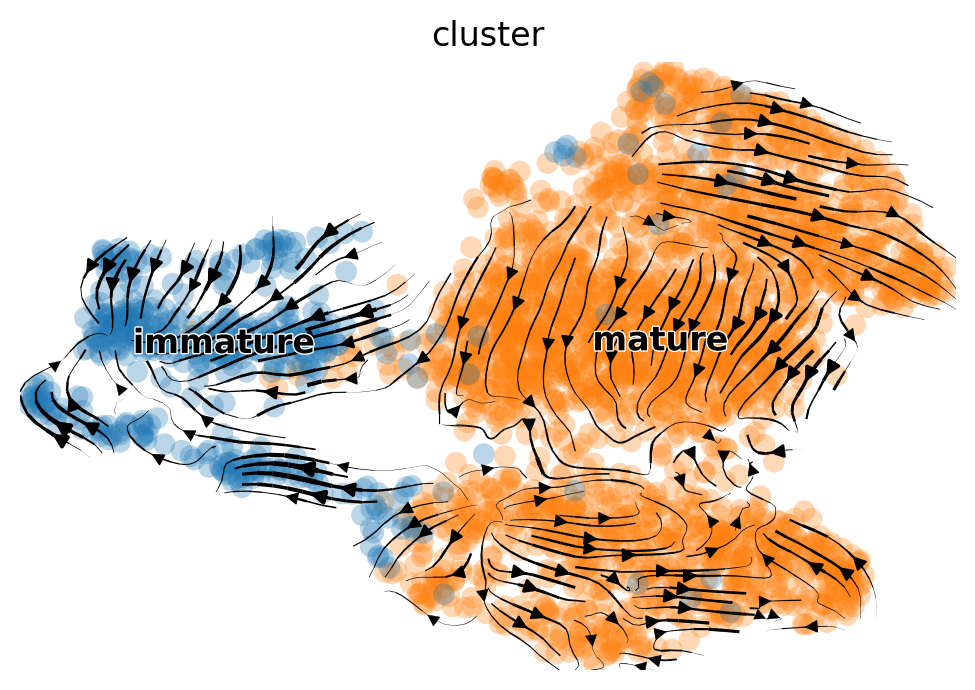

In [ ]:
scv.pl.velocity_embedding_stream(f, basis = 'umap', color = "cluster",save = 'velocity-embedding-stream-cluster.pdf')

#Final cluster names


In [ ]:
#naming clusters on basis of expression of markers
f.obs['celltype'] = 'Mature cells'
f.obs['celltype'][f.obs['louvain']=='1'] = 'Immature cells'

saving figure to file ./figures/scvelo_velocity_embedding_stream.pdf


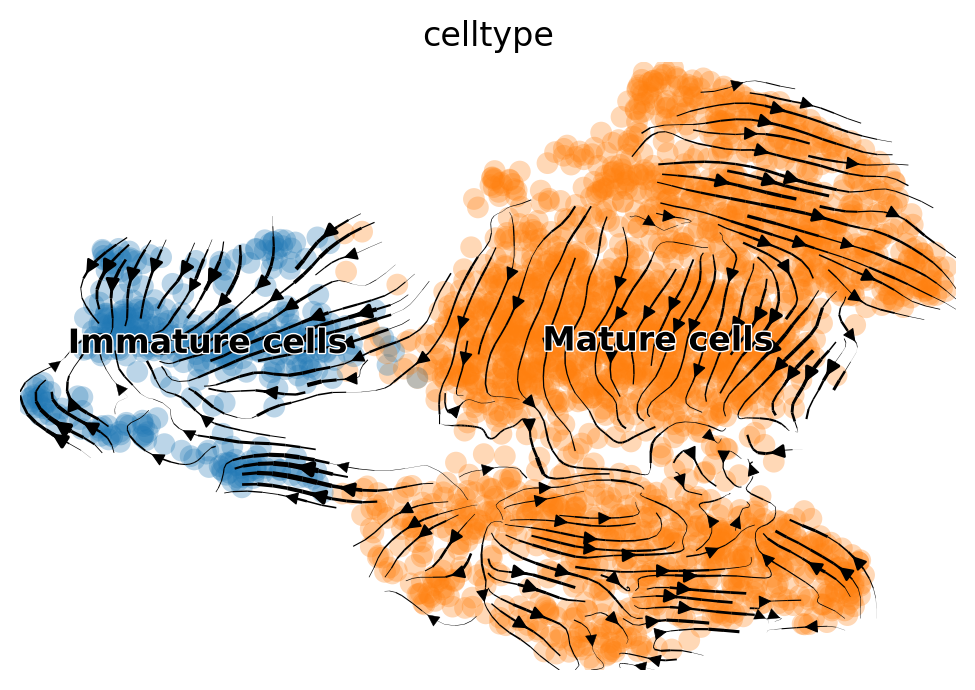

In [ ]:
scv.pl.velocity_embedding_stream(f, basis = 'umap', color = 'celltype',save= 'velocity_embedding_stream.pdf')

In [ ]:
#adding celltype info to filtered file data
k = f.obs['celltype']
ddata.obs['celltype'] = k

In [ ]:
markers = ["Ncam1","Lhx2","Gng8", "Rcor1","Ctxn3","Gap43", "Myo6", "Stoml3",
                           "Gng13","Ech1","Dcx","Gnal"]

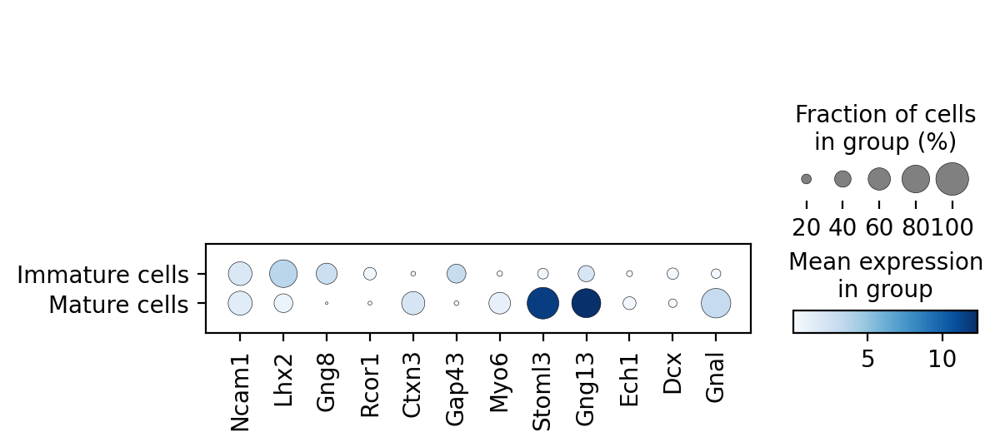

In [ ]:
scp.pl.dotplot(ddata, markers,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot_all_markers.pdf')

# CLUSTER SEGREGATION TO FIND THEIR IDENTITY IN R




IMMATURE

In [ ]:
#extracting iOSN cell data
clus = (f.obs["celltype"]  == "Immature cells")
clus1 = f[clus].copy()
clus1_ind = clus1.obs_names
clus1_list = clus1_ind.to_list()
#clus1_list = [sub[ : -2] for sub in clus1_ind]
clust1 = adata[clus1_list, :]

Umap coordinates

In [ ]:
#extract umap coordinates
umap1 = clus1.obsm['X_umap']
umap1 = pd.DataFrame(umap1)
umap1.index = clus1.obs_names
umap1.to_csv('umapimmat.csv')

spliced of mature --- 1

In [ ]:
#spliced data
spl1 = clust1.layers['spliced']
spl1 = spl1.todense()
spl1 = pd.DataFrame(spl1)
spl1.columns = clust1.var_names
spl1.index = clust1.obs_names
spl1.to_csv('splimmat.csv')

Unspliced of mature

In [ ]:
#unspliced data
uspl1 = clust1.layers['unspliced']
uspl1 = uspl1.todense()
uspl1 = pd.DataFrame(uspl1)
uspl1.columns = clust1.var_names
uspl1.index = clust1.obs_names
uspl1.to_csv('usplimma.csv')

#cluster 4

In [ ]:
#mOSN data
clus = (f.obs["celltype"]  == "Mature cells")
clus4 = f[clus].copy()
clus4_ind = clus4.obs_names
clus4_list = clus4_ind.to_list()
#clus4_list = [sub[ : -2] for sub in clus4_ind]
clust4 = adata[clus4_list, :]

umap

In [ ]:
#umap coordinates
umap4 = clus4.obsm['X_umap']
umap4 = pd.DataFrame(umap4)
umap4.index = clus4.obs_names
umap4.to_csv('umapmature.csv')

spliced

In [ ]:
#spliced data
spl4 = clust4.layers['spliced']
spl4 = spl4.todense()
spl4 = pd.DataFrame(spl4)

In [ ]:
spl4.columns = clust4.var_names
spl4.index = clust4.obs_names

In [ ]:
spl4.to_csv('splmature.csv')

unspliced

In [ ]:
#unspliced data
uspl4 = clust4.layers['unspliced']
uspl4 = uspl4.todense()
uspl4 = pd.DataFrame(uspl4)
uspl4.columns = clust4.var_names
uspl4.index = clust4.obs_names
uspl4.to_csv('usplmature.csv')

# Downstream analysis
IMPORTANT GENES

In [ ]:
#calculating rank velocity genes
scv.tl.rank_velocity_genes(f, groupby='celltype', min_corr=.3)
df = scv.DataFrame(f.uns['rank_velocity_genes']['names'])
df.head()
df.to_csv('rank-velocity-genes-knock.csv')

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


saving figure to file ./figures/scvelo_scatterplot_Immature_cells.pdf


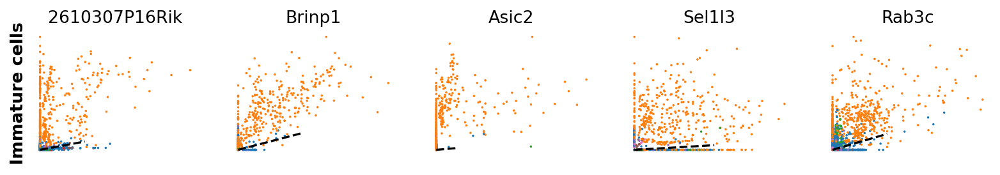

saving figure to file ./figures/scvelo_scatterplot_mature_cells.pdf


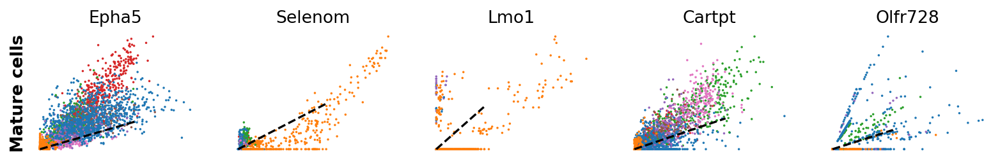

In [ ]:
#Expressions of velocity genes
kwargs = dict(frameon=False, size=10, linewidth=1.5)

scv.pl.scatter(f, df['Immature cells'][:5], ylabel='Immature cells', **kwargs, save = 'scatterplot_Immature_cells.pdf')
scv.pl.scatter(f, df['Mature cells'][:5], ylabel='Mature cells', **kwargs, save = 'scatterplot_mature_cells.pdf')


VELOCITIES IN CYCLING PROGENITOR

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
saving figure to file ./figures/scvelo_cell-score.pdf


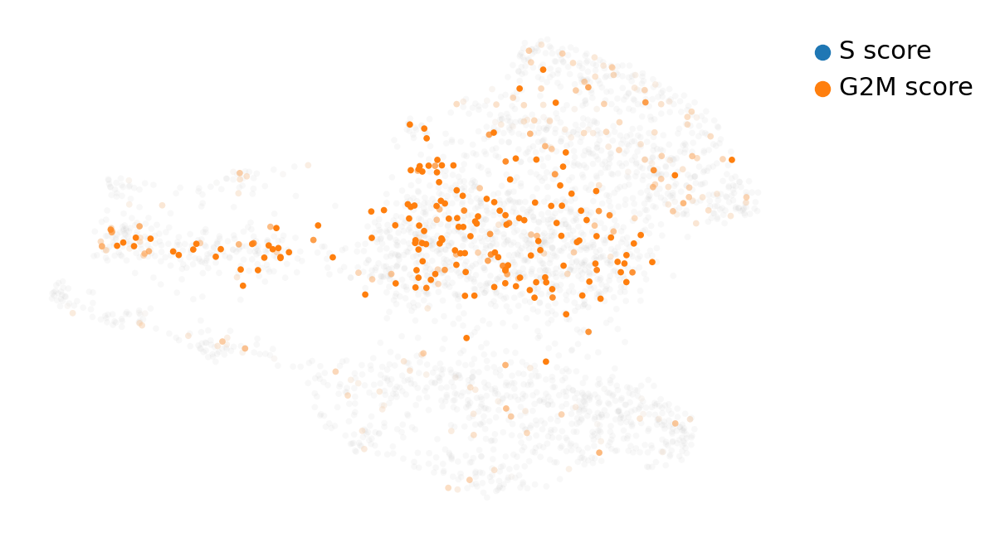

In [ ]:
#calculating cell cycle score 
scv.tl.score_genes_cell_cycle(f)
scv.pl.scatter(f, color_gradients=['S_score', 'G2M_score' ], perc=[5, 95], save = 'cell-score.pdf')

SPEED AND COHERENCE

In [ ]:
#calculating rate of differentiation
scv.tl.velocity_confidence(f)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


saving figure to file ./figures/scvelo_speed_and_coherence.pdf


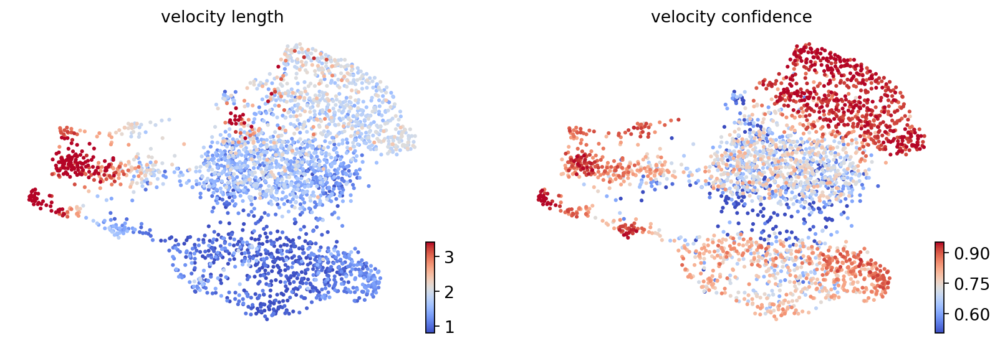

In [ ]:
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(f, c=keys, cmap='coolwarm', perc=[5, 95], color = 'celltype', save = 'speed_and_coherence.pdf')

In [ ]:
df = f.obs.groupby('celltype')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

celltype,Immature cells,Mature cells
velocity_length,2.779036,1.499426
velocity_confidence,0.843776,0.759366


In [ ]:
df.to_csv('velocity-length-and-conf.csv')

In [ ]:
vl = f.obs['velocity_length']
vl.to_csv('velocity-length-knock.csv')

In [ ]:
vm = f.obs['velocity_confidence']
vm.to_csv('velocity-confi-knock.csv')

VELOCITY GRAPH AND PSEUDOTIME

computing terminal states
    identified 3 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_pseudotime.pdf


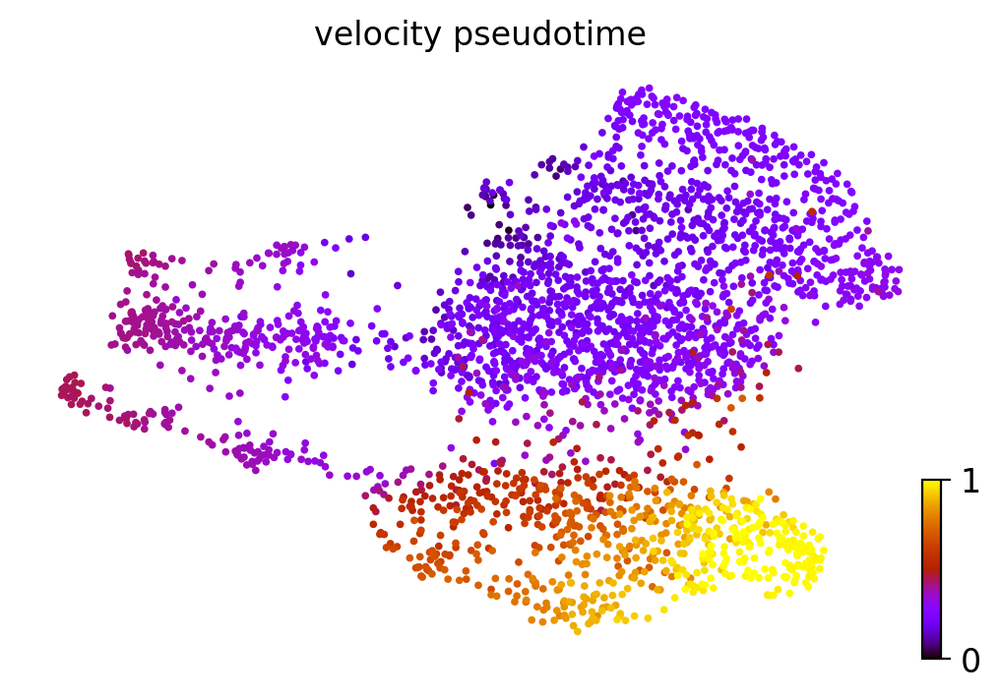

In [ ]:
#calculate pseudotime
scv.tl.velocity_pseudotime(f)
scv.pl.scatter(f, color='velocity_pseudotime', cmap='gnuplot', save = 'pseudotime.pdf')

PAGA VELOCITY GRAPH

In [ ]:
#calculate PAGA for trajectory inference
f.uns['neighbors']['distances'] = f.obsp['distances']
f.uns['neighbors']['connectivities'] = f.obsp['connectivities']
scv.tl.paga(f, groups='celltype')
df = scv.get_df(f, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')


running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1
0,0,0
1,0.084,0


saving figure to file ./figures/scvelo_PAGA.pdf


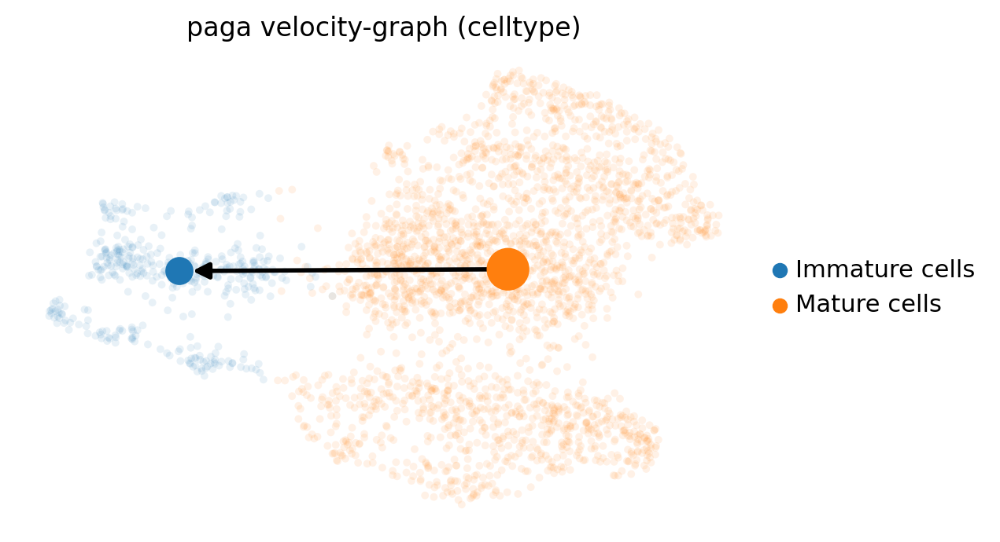

In [ ]:
scv.pl.paga(f, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, save = 'PAGA.pdf')

# Dynamical modeling

In [ ]:
#recovering dynamics of data
scv.tl.recover_dynamics(f)

recovering dynamics (using 1/20 cores)



    finished (0:02:15) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [ ]:
#calculating velocity on dynamical model
scv.tl.velocity(f, mode='dynamical')
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res



    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_differential_velocity_stream.png


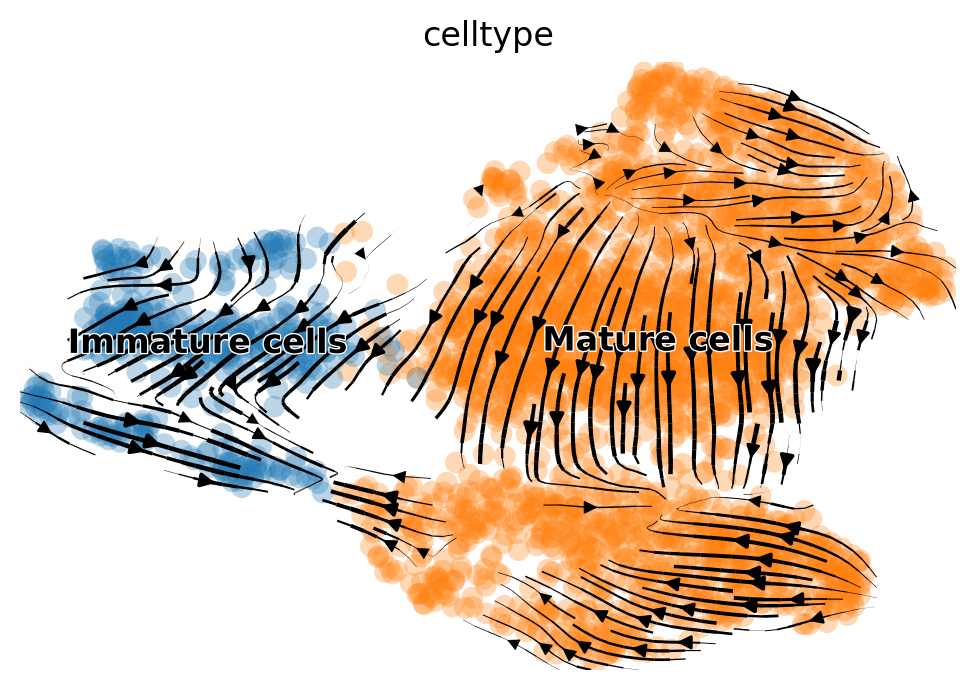

In [ ]:
scv.pl.velocity_embedding_stream(f, basis='umap', color = 'celltype', save = 'differential_velocity_stream.pdf')

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)
saving figure to file ./figures/scvelo_Latent_time.pdf


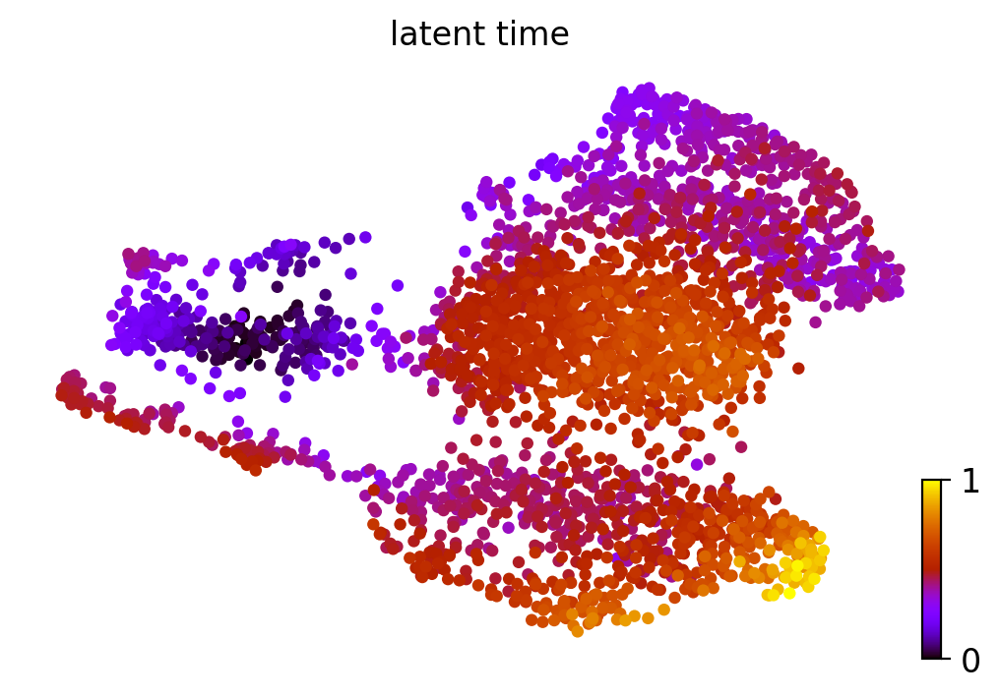

In [ ]:
#calculating latent time
scv.tl.latent_time(f)
scv.pl.scatter(f, color='latent_time', color_map='gnuplot', size=80, save = 'Latent_time.pdf')

CLUSTER SPECIFIC TOP LIKELIHOOD GENES

In [ ]:
#ranking dynamical genes
scv.tl.rank_dynamical_genes(f, groupby='celltype')
df = scv.get_df(f, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Immature cells,Mature cells
0,Selenom,Stoml3
1,Sult6b1,S100a5
2,Crabp1,Cartpt
3,Baz1a,Spef2
4,Tex15,Pcp4l1


In [ ]:
df.to_csv('rank-dynamical-genes-kno.csv')

# CELL RANK

In [ ]:
#calculate terminal states
cr.tl.terminal_states(f, weight_connectivities=0.2,cluster_key='celltype')

saving figure to file ./figures/scvelo_cellrank_Terminalstates.pdf


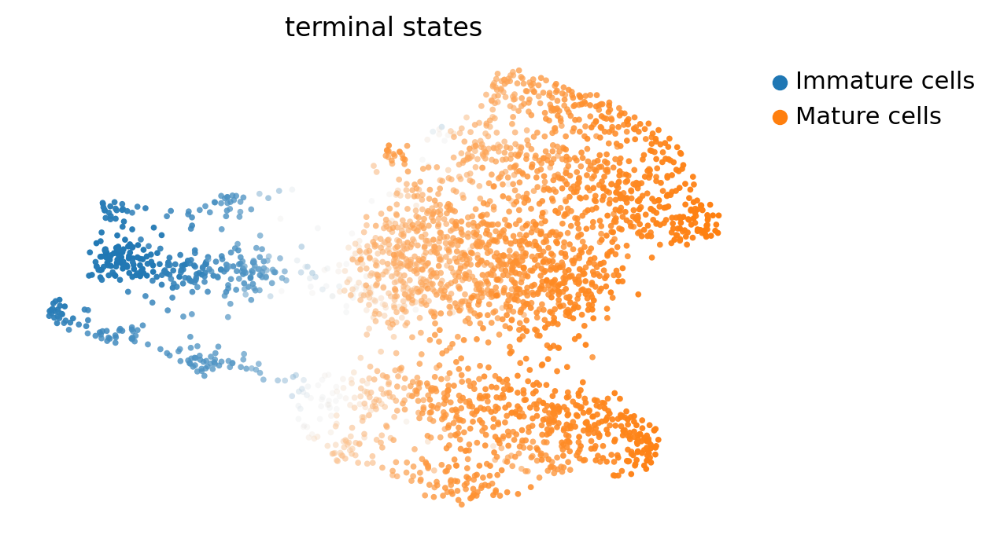

In [ ]:
cr.pl.terminal_states(f, cluster_key='celltype', save = 'cellrank_Terminalstates.pdf')

In [ ]:
#calculate initial states
cr.tl.initial_states(f, cluster_key='celltype')

saving figure to file ./figures/scvelo_cellrank_lineages.pdf


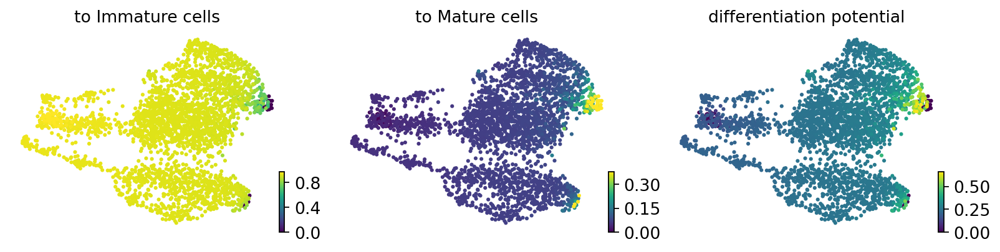

In [ ]:
#calculate lineages
cr.tl.lineages(f)
cr.pl.lineages(f, same_plot=False, save = 'cellrank_lineages.pdf')

In [ ]:
scv.tl.latent_time(f, root_key= 'initial_state_probs', end_key='terminal_states_probs')

computing latent time using root_cells, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


In [ ]:
#calculate paga for trajectory inference using cellrank
scv.tl.paga(f, groups='celltype', root_key='initial_state_probs', end_key='terminal_states_probs',
            use_time_prior='velocity_pseudotime')

running PAGA using priors: ['velocity_pseudotime', 'terminal_states_probs']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


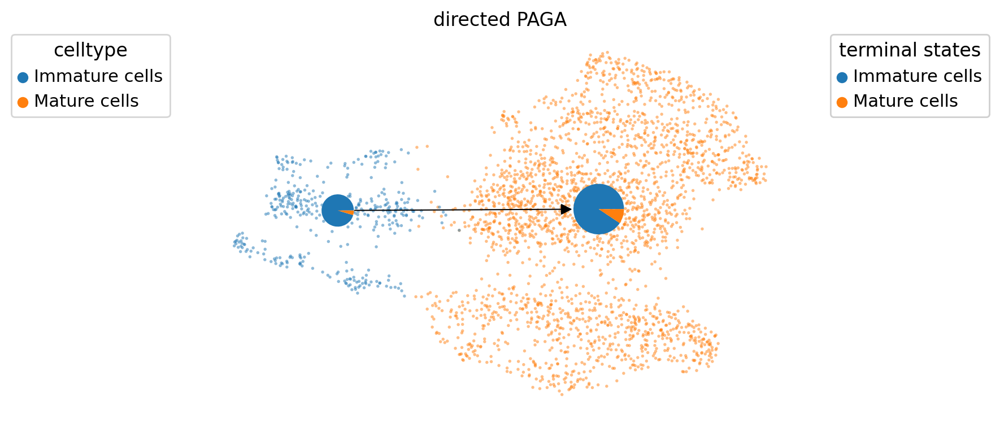

In [ ]:
cr.pl.cluster_fates(f, mode="paga_pie", cluster_key="celltype", basis='umap', 
                    legend_kwargs={'loc': 'top right out'}, legend_loc='top left out', 
                    node_size_scale=5, edge_width_scale=1, max_edge_width=4, title='directed PAGA', save = 'Cellrank-Differential_PAGA.pdf')

In [ ]:
cr.tl.lineage_drivers(f)

,Immature cells corr,Immature cells pval,Immature cells qval,Immature cells ci low,Immature cells ci high,Mature cells corr,Mature cells pval,Mature cells qval,Mature cells ci low,Mature cells ci high
Sox11,0.16,2.73e-18,4.96e-16,0.12,0.20,-0.16,2.73e-18,4.96e-16,-0.20,-0.12
Lhx2,0.12,1.79e-10,2.56e-08,0.08,0.15,-0.12,1.79e-10,2.56e-08,-0.15,-0.08
Stmn2,0.12,2.65e-10,3.31e-08,0.08,0.15,-0.12,2.65e-10,3.31e-08,-0.15,-0.08
Tmsb4x,0.12,4.20e-10,4.95e-08,0.08,0.15,-0.12,4.21e-10,4.95e-08,-0.15,-0.08
Rps28,0.11,6.30e-09,6.30e-07,0.07,0.14,-0.11,6.30e-09,6.30e-07,-0.14,-0.07
...,...,...,...,...,...,...,...,...,...,...
Olfr1501,-0.22,1.92e-33,7.67e-31,-0.25,-0.19,0.22,1.92e-33,7.67e-31,0.19,0.25
Olfr1288,-0.22,1.44e-33,7.19e-31,-0.25,-0.19,0.22,1.44e-33,7.19e-31,0.19,0.25
Ppa1,-0.27,1.51e-51,1.01e-48,-0.31,-0.24,0.27,1.51e-51,1.01e-48,0.24,0.31
S100a5,-0.34,1.25e-81,1.25e-78,-0.37,-0.31,0.34,1.25e-81,1.25e-78,0.31,0.37


In [ ]:
root_idx = np.where(f.obs['celltype'] == 'Immature cells')[0][0]

In [ ]:
f.uns['iroot'] = root_idx

In [ ]:
scp.tl.dpt(f)

In [ ]:
model = cr.ul.models.GAM(f)

ADVANCE

In [ ]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(f)

In [ ]:
vk.compute_transition_matrix()

<Velo>

In [ ]:
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(f).compute_transition_matrix()

In [ ]:
combined_kernel = 0.8 * vk + 0.2 * ck
root_idx = np.where(f.obs['celltype'] == 'Immature cells')[0][0]
f.uns['iroot'] = root_idx


In [ ]:
from cellrank.tl.kernels import PalantirKernel
pk = PalantirKernel(f, time_key='dpt_pseudotime').compute_transition_matrix()
print(pk)

<Pala[k=3, dnorm=True, n_neighs=30]>


In [ ]:
from cellrank.tl.estimators import GPCCA
g = GPCCA(combined_kernel)
print(g)

GPCCA[n=2905, kernel=((0.8 * <Velo[softmax_scale=3.79, mode=deterministic, seed=6148, scheme=<CorrelationScheme>]>) + (0.2 * <Conn[dnorm=True]>))]


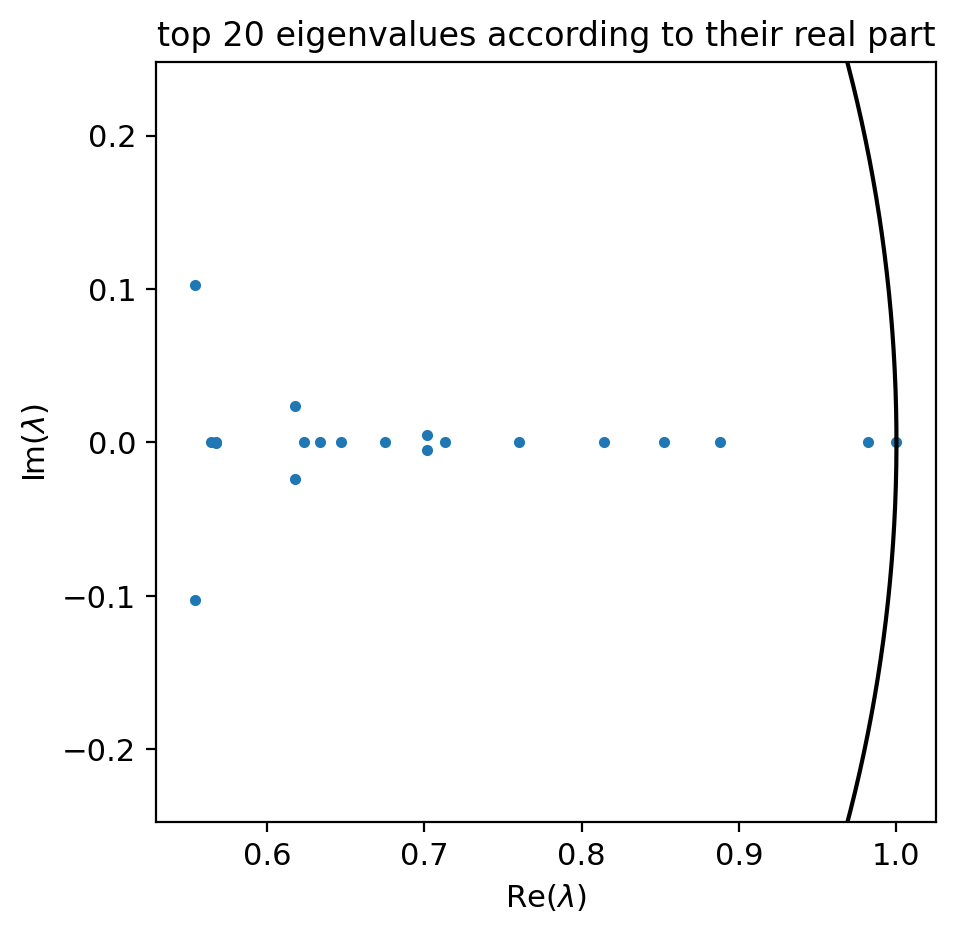

In [ ]:
g.compute_schur(n_components=20)
g.plot_spectrum(save='cellrank-eigenvalues.pdf')

saving figure to file ./figures/scvelo_cellrank-macrostates.pdf


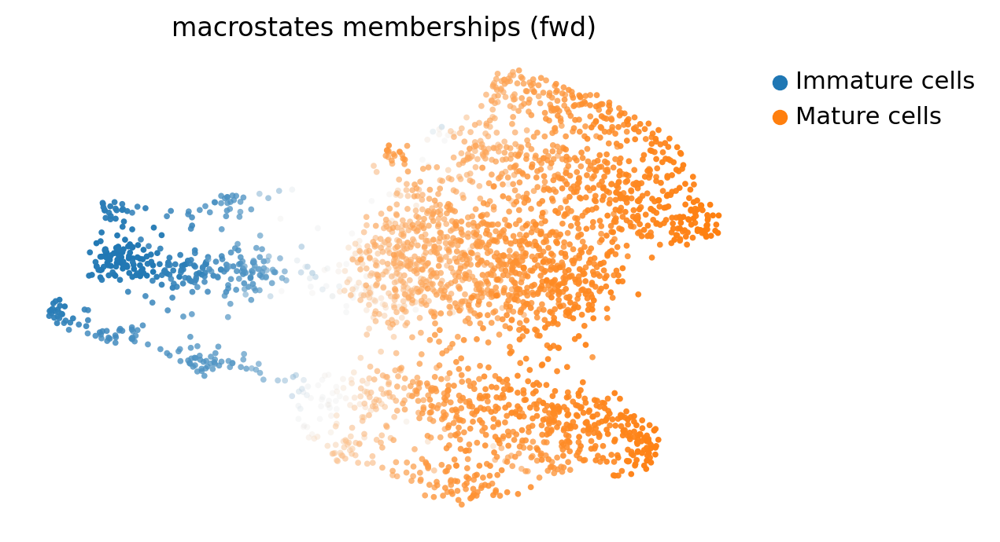

In [ ]:
g.compute_macrostates(n_states=2, cluster_key='celltype')
g.plot_macrostates(save = 'cellrank-macrostates.pdf')

In [ ]:
g.set_terminal_states_from_macrostates()

In [ ]:
g.compute_absorption_probabilities()

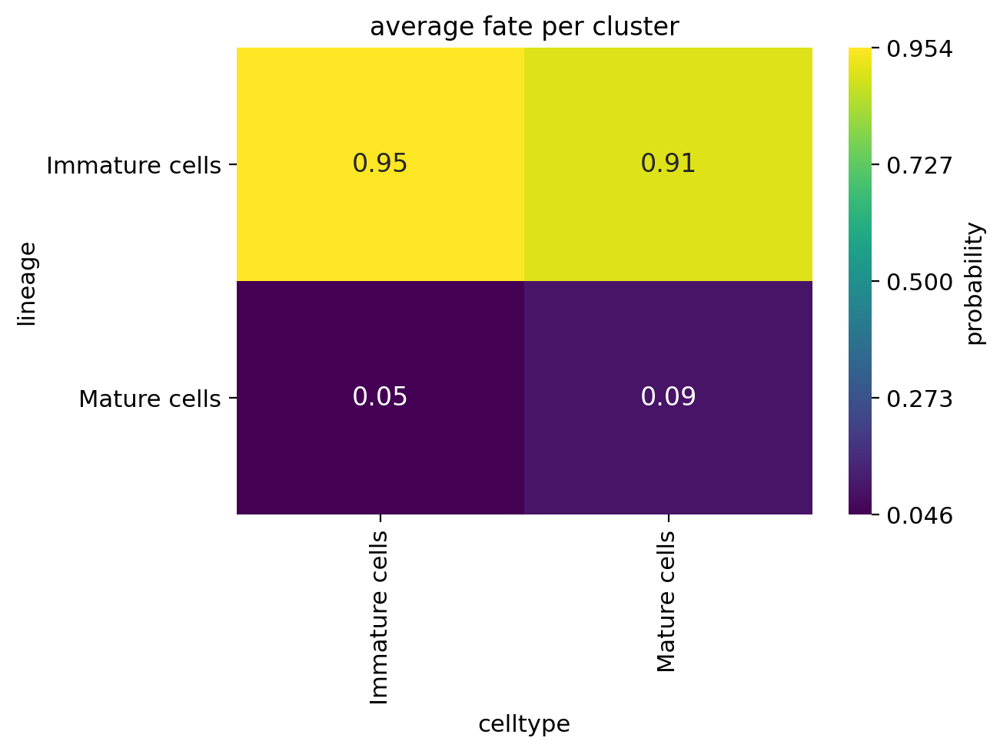

In [ ]:
cr.pl.cluster_fates(f, cluster_key='celltype', mode='heatmap', save = 'cellrank-heatmap-clusterfate.pdf')

# Differential kinetics

In [ ]:
#running differential kinetic test
scv.tl.differential_kinetic_test(f, groupby='celltype')


testing for differential kinetics
    finished (0:00:19) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


TOP LIKELIHOOD genes

In [ ]:
#recovering dynamics of the data
scv.tl.recover_dynamics(f)


recovering dynamics (using 1/20 cores)



    finished (0:01:35) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [ ]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(f, groupby='celltype')

testing for differential kinetics
    finished (0:00:19) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


RECOMPUTING VELOCITIES

In [ ]:
#recomputing velocity using differential model
scv.tl.velocity(f, diff_kinetics=True, groupby='celltype')
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res



    finished (0:00:06) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_differential-velocity.pdf


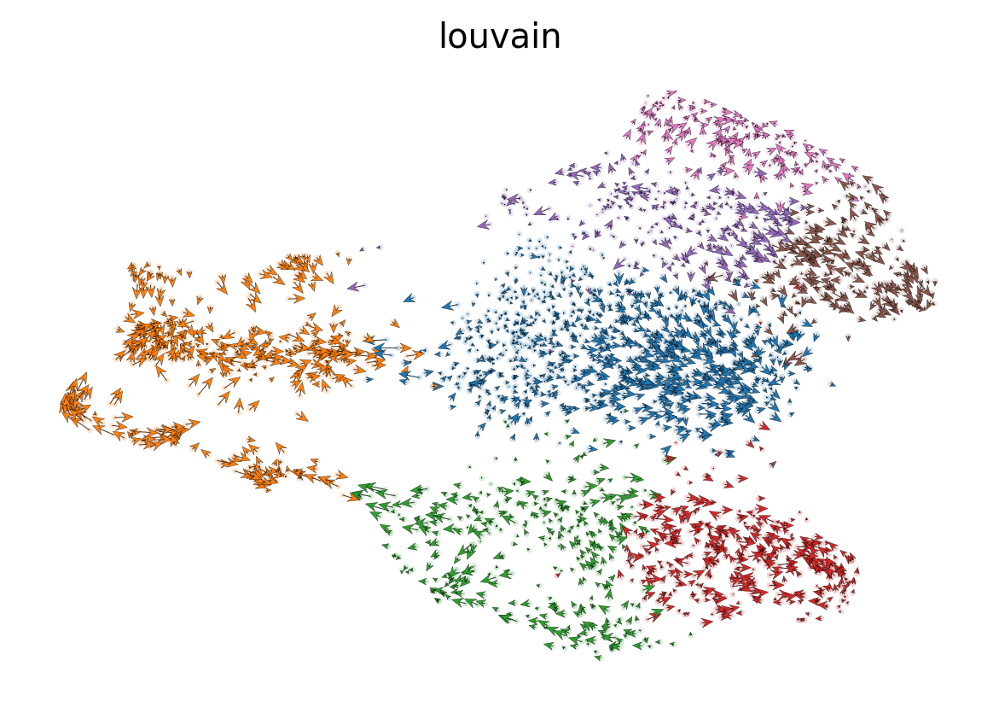

In [ ]:
scv.pl.velocity_embedding(f, dpi=120, arrow_size=2, arrow_length=2, save = 'differential-velocity.pdf')


DIFFERENTIAL GENE EXPRESSION

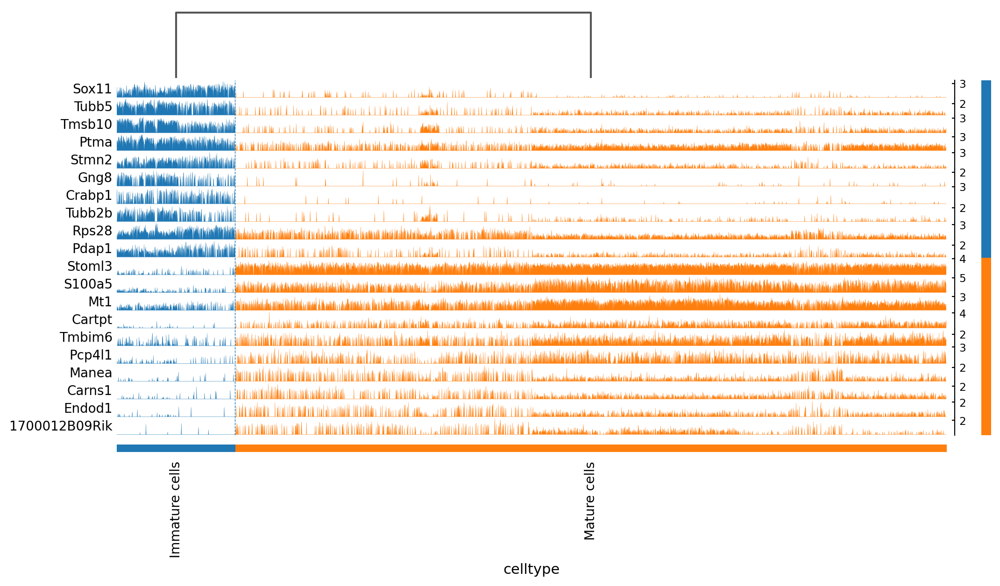

In [ ]:
scp.tl.rank_genes_groups(f, groupby='celltype', use_raw=True, 
                        method='t-test_overestim_var', n_genes=10) # compute differential expression
scp.pl.rank_genes_groups_tracksplot(f, groupby='celltype', save = 'differentialexp.pdf')

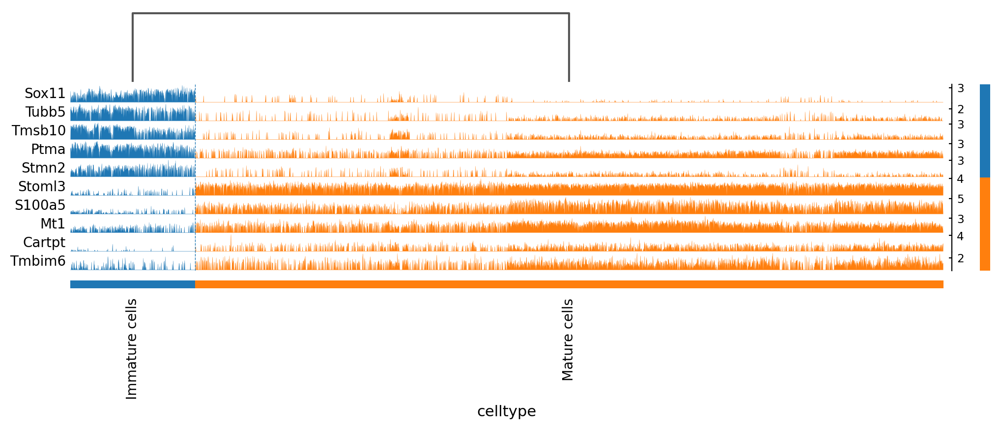

In [ ]:
scp.tl.rank_genes_groups(f, groupby='celltype', use_raw=True, 
                        method='t-test_overestim_var', n_genes=5) # compute differential expression
scp.pl.rank_genes_groups_tracksplot(f, groupby='celltype', save = 'diffexp5genes.pdf')

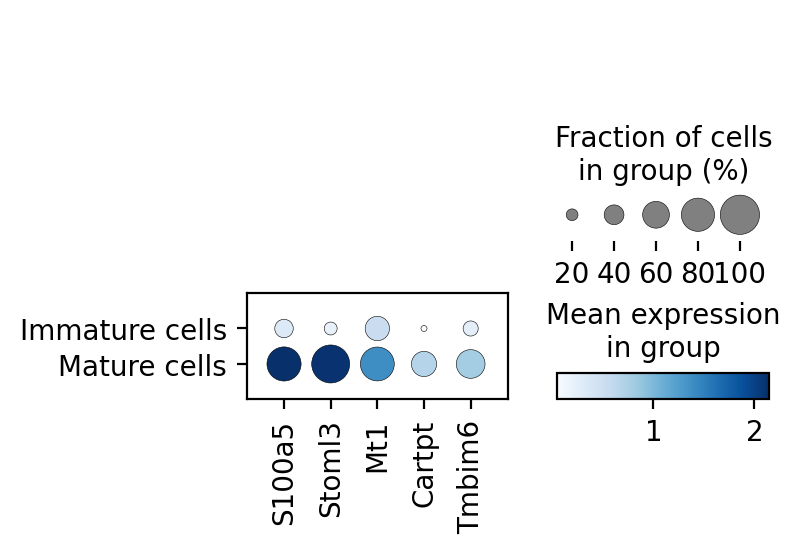

In [ ]:
m = ['S100a5', 'Stoml3', 'Mt1', 'Cartpt', 'Tmbim6']
scp.pl.dotplot(f, m,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-mature-diffexp.pdf')

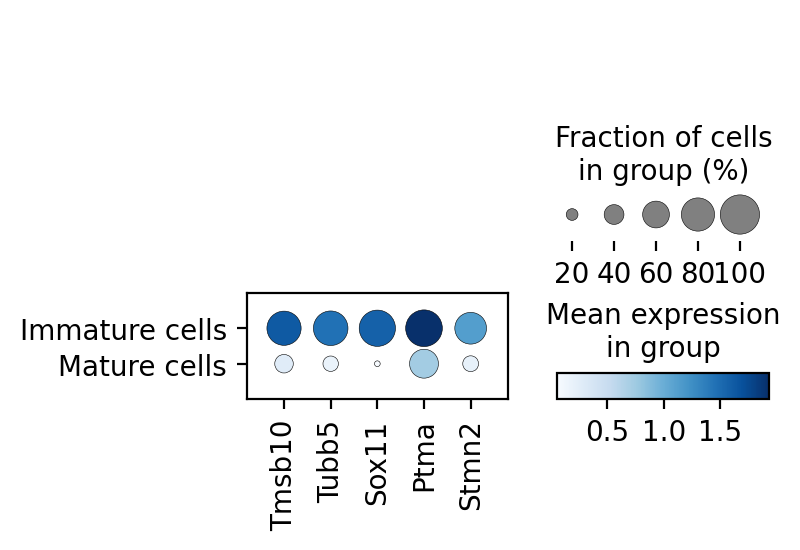

In [ ]:
im = ['Tmsb10', 'Tubb5', 'Sox11', 'Ptma', 'Stmn2']
scp.pl.dotplot(f, im,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-immature-diffexp.pdf')